# Assignment 2: Evaluating Linear Models

-----------------------

**Dr. Dave Wanik - OPIM 5512: Data Science Using Python - University of Connecticut**

-------------------------------

**Your Name Here:** Adam Syed

Put all of your skills to work on a basic modeling example! And let's see if we can use ChatGPT to help deepen your learning on this topic.

First things first, [Download the CT Real Estate Transactions data here](https://drive.google.com/file/d/12m6UYYt0Osa3JLLfPZRLlBipRUS9ixGd/view?usp=sharing), drag onto your Google Drive, make a shareable link and download it with `!gdown`, then read the dataframe as `df`. Then...


In [1]:
# here is a nice way to download as a shareable link - you just need to 'steal' the ID of the file and you can use gdown
# after you run this, the file will be downloaded to your local runtime and your are ready to rock!
# of course, local files on your runtime are deleted after you close the session, but this is OK.

# https://drive.google.com/file/d/1AqU0lrw0DupBcG8poZPWN7UGFFoR4IUJ/view?usp=sharing
!gdown 1AqU0lrw0DupBcG8poZPWN7UGFFoR4IUJ

Downloading...
From: https://drive.google.com/uc?id=1AqU0lrw0DupBcG8poZPWN7UGFFoR4IUJ
To: /Users/adamyeeter/OPIM 5512 Python/Real_Estate_Sales_2014-2016.csv
100%|██████████████████████████████████████| 15.4M/15.4M [00:00<00:00, 18.4MB/s]


In [2]:
import pandas as pd
df = pd.read_csv('Real_Estate_Sales_2014-2016.csv')


# Part 1a: Use ChatGPT to generate a regression recipe
I used to give this as the homework, where students had to reference my materials and documentation to solve this notebook. ChatGPT is actually pretty slick  and can generate a basic regression recipe for you. So... why not see what it can do?! Copy and paste these instructions into ChatGPT and ask it to write a Python code to solve this homework. Copy and paste it, update it if needed, and run it.

* Q1) Drop any rows where the `AssessedValue` is greater than 1 million USD
* Q2) Count how many rows have missing values, then drop any rows with missing values.
* Q3) Examine the head of the dataframe and check the column types using .info() to ensure that all numeric columns are appropriately converted as such.
* Q4) Count how many unique values are in the `Town` column.
* Q5) Make a new dataframe called `tmp` of dummy variables for each value in the `Town` column. (hint: this dataframe should have somewhere around 127055 rows and 169 columns, one column for each town).
* Q6) Make a new dataframe called `X` that subsets the `AssessedValue` and `ListYear` from `df`, and concatenate with your dataframe called `tmp`. Hint: This dataframe should have 171 columns.
* Q7) Subset `SaleAmount` from `df` and assign to a variable called `y`.
* Q8) Convert `X` and `y` to numpy arrays. Split your data in X_train, X_test, y_train, y_test using your 7 digit student ID as the random seed and an 80/20 split.
* Q9) Fit a linear regression model. Calculate mean absolute error for each partition.
* Q10) Make a scatterplot of actual vs. predicted values for each partition with nice axis labels, titles and markers. You should use a log axis each axis so that outliers don't dominate your plot.

* `plt.xscale('log')`
* `plt.yscale('log')`

Please use nice subheaders for each question so that your code is easy to review.



## Your ChatGPT Screenshot
Make sure the screenshot of time and date is included in the image.

In [3]:
# students: paste both a screenshot of your prompt and code
# (for academic integrity) and your actual ChatGPT python code here

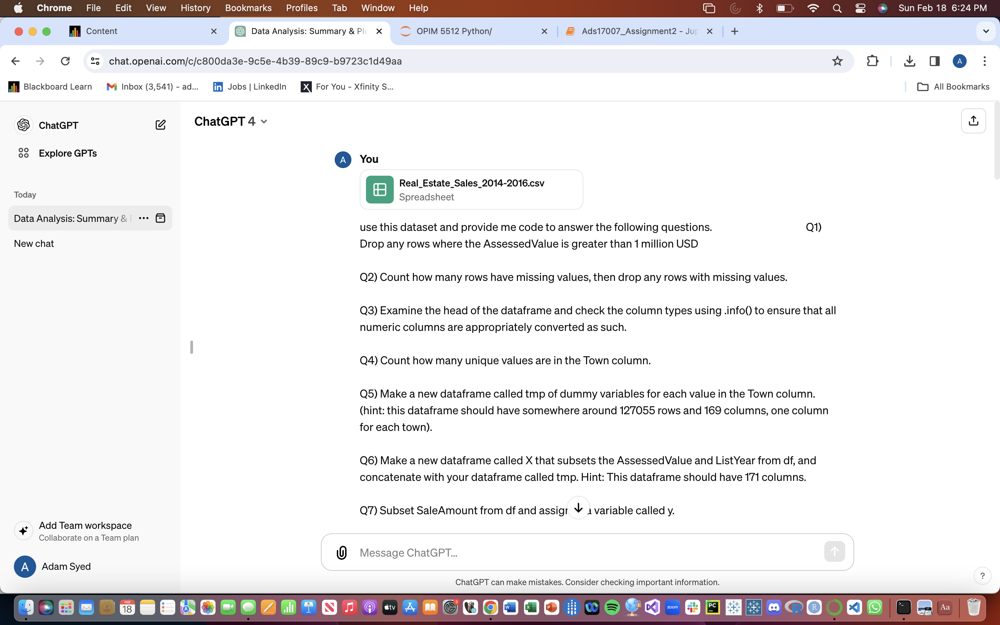

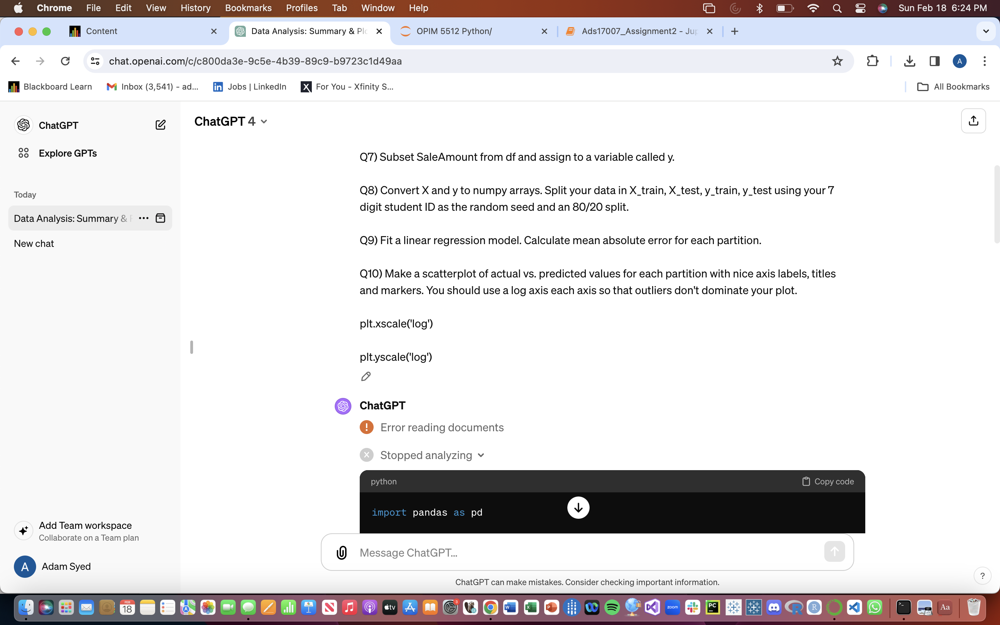

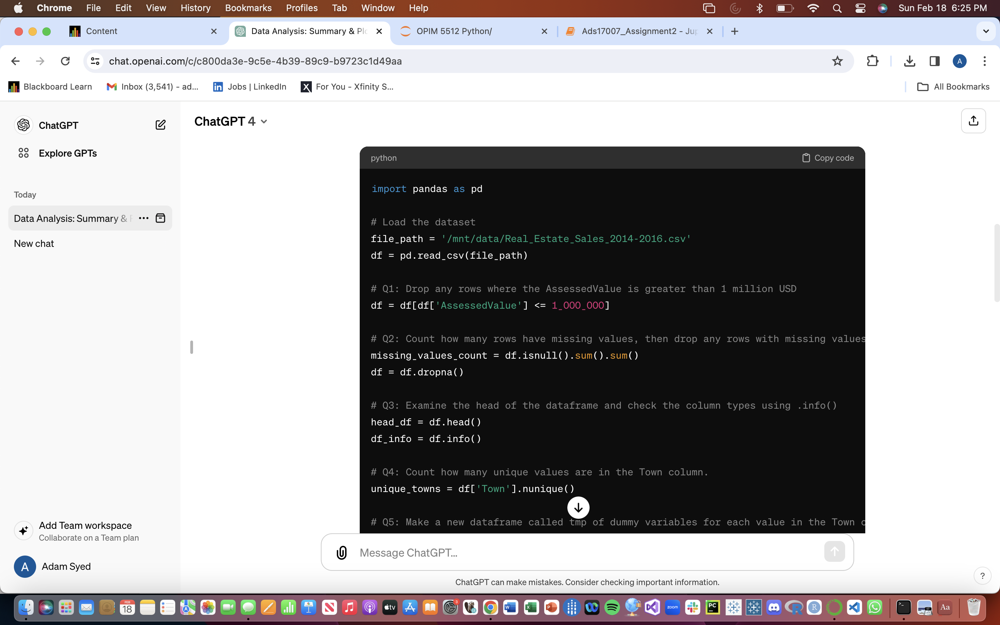

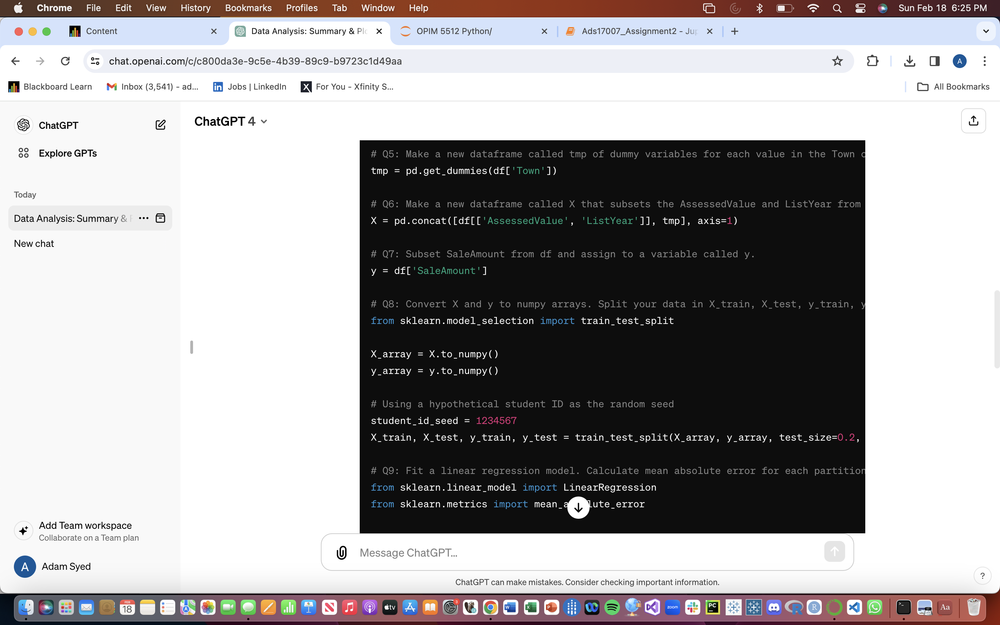

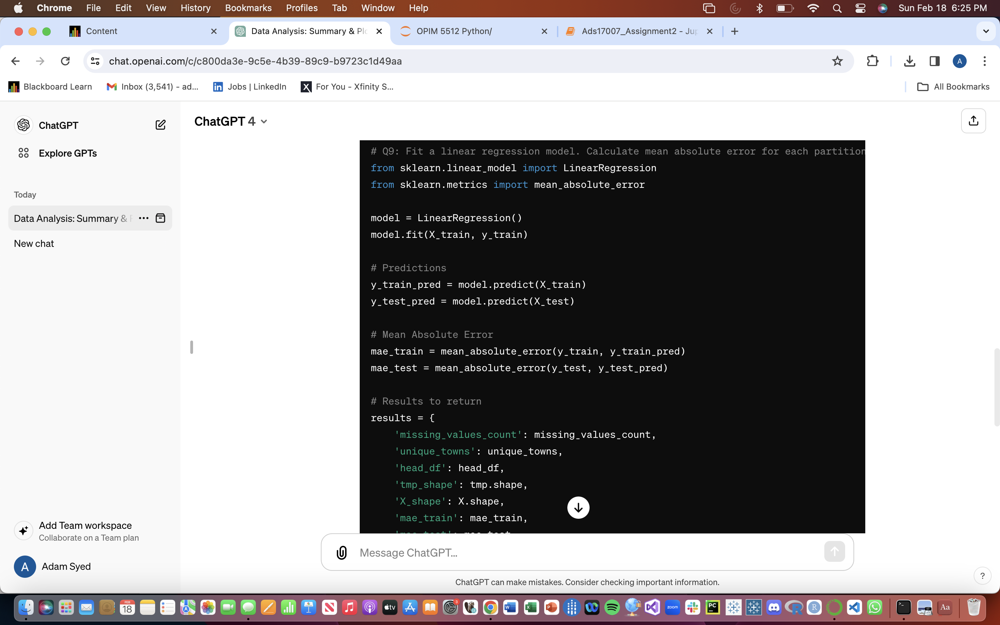

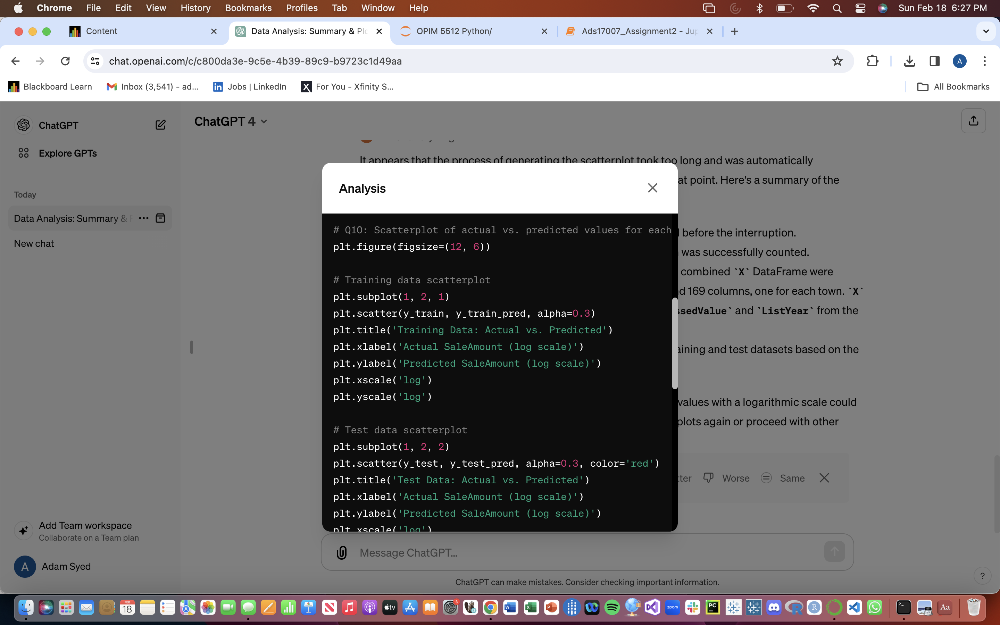

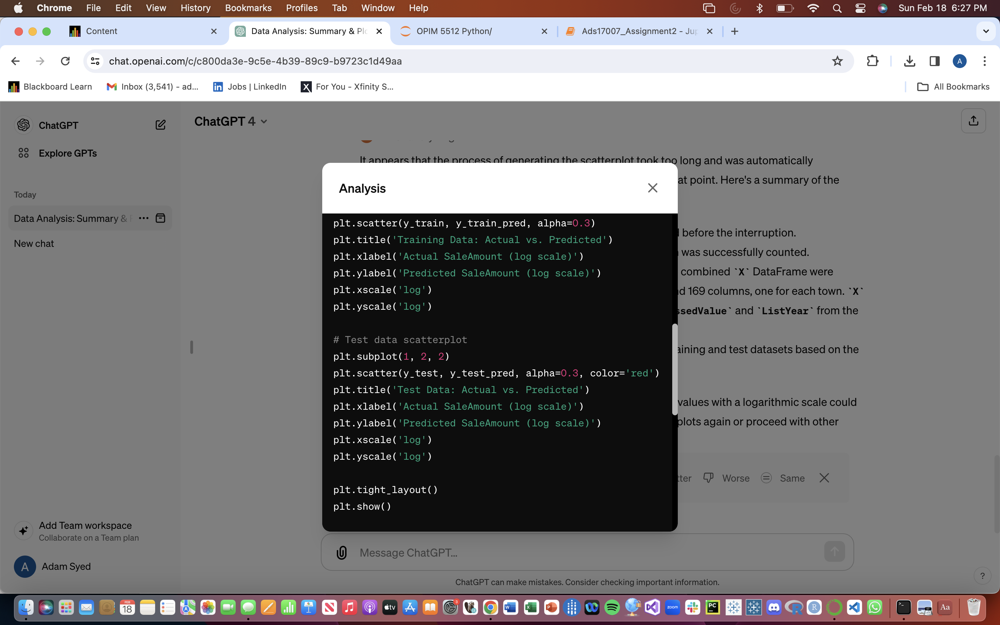

## Your ChatGPT Code
Don't just copy/paste as one cell, make nice subheaders for each question please.

### Q1

In [4]:
# Q1: Drop any rows where the AssessedValue is greater than 1 million USD
df = df[df['AssessedValue'] <= 1_000_000]

### Q2

In [5]:
# Q2: Count how many rows have missing values, then drop any rows with missing values.
missing_values_count = df.isnull().sum().sum()
df = df.dropna()
missing_values_count

15031

### Q3

In [6]:
# Q3: Examine the head of the dataframe and check the column types using .info()
head_df = df.head()
df_info = df.info()
head_df

<class 'pandas.core.frame.DataFrame'>
Int64Index: 127055 entries, 1 to 145941
Data columns (total 11 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   ID               127055 non-null  int64  
 1   SerialNumber     127055 non-null  int64  
 2   ListYear         127055 non-null  int64  
 3   DateRecorded     127055 non-null  object 
 4   Town             127055 non-null  object 
 5   Address          127055 non-null  object 
 6   AssessedValue    127055 non-null  int64  
 7   SaleAmount       127055 non-null  float64
 8   SalesRatio       127055 non-null  float64
 9   PropertyType     127055 non-null  object 
 10  ResidentialType  127055 non-null  object 
dtypes: float64(2), int64(4), object(5)
memory usage: 11.6+ MB


,ID,SerialNumber,ListYear,DateRecorded,Town,Address,AssessedValue,SaleAmount,SalesRatio,PropertyType,ResidentialType
1,2,14011,2014,1/14/2015,Andover,1 JUROVATY LANE,153100,190000.0,0.805789,Residential,Single Family
2,3,15006,2015,11/30/2015,Andover,1 ROSE LANE,102900,50000.0,2.058000,Residential,Single Family
3,4,14044,2014,9/28/2015,Andover,10 PINE RIDGE DR,108700,128368.0,0.846784,Residential,Single Family
4,5,14035,2014,8/10/2015,Andover,101 WALES RD,164000,230000.0,0.713043,Residential,Single Family
5,6,15051,2015,9/28/2016,Andover,107 LAKESIDE DR,188400,226000.0,0.833628,Residential,Single Family


### Q4

In [7]:
# Q4: Count how many unique values are in the Town column.
unique_towns = df['Town'].nunique()
unique_towns

169

### Q5

In [8]:
# Q5: Make a new dataframe called tmp of dummy variables for each value in the Town column.
tmp = pd.get_dummies(df['Town'])
tmp

,Andover,Ansonia,Ashford,Avon,Barkhamsted,Beacon Falls,Berlin,Bethany,Bethel,Bethlehem,...,Willington,Wilton,Winchester,Windham,Windsor,Windsor Locks,Wolcott,Woodbridge,Woodbury,Woodstock
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145937,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
145938,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
145939,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
145940,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


### Q6

In [9]:
# Q6: Make a new dataframe called X that subsets the AssessedValue and ListYear from df, and concatenate with tmp.
X = pd.concat([df[['AssessedValue', 'ListYear']], tmp], axis=1)
X

,AssessedValue,ListYear,Andover,Ansonia,Ashford,Avon,Barkhamsted,Beacon Falls,Berlin,Bethany,...,Willington,Wilton,Winchester,Windham,Windsor,Windsor Locks,Wolcott,Woodbridge,Woodbury,Woodstock
1,153100,2014,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,102900,2015,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,108700,2014,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,164000,2014,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,188400,2015,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145937,105900,2015,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
145938,0,2014,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
145939,0,2015,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
145940,222860,2015,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


### Q7

In [10]:
# Q7: Subset SaleAmount from df and assign to a variable called y.
y = df['SaleAmount']
y

1         190000.0
2          50000.0
3         128368.0
4         230000.0
5         226000.0
            ...   
145937     50107.0
145938     15000.0
145939      8000.0
145940    278701.0
145941    320000.0
Name: SaleAmount, Length: 127055, dtype: float64

### Q8

In [11]:
# Q8: Convert X and y to numpy arrays. Split your data in X_train, X_test, y_train, y_test.
from sklearn.model_selection import train_test_split

X_array = X.to_numpy()
y_array = y.to_numpy()

# Using a hypothetical student ID as the random seed
student_id_seed = 2735566
X_train, X_test, y_train, y_test = train_test_split(X_array, y_array, test_size=0.2, random_state=student_id_seed)

### Q9

In [12]:
# Q9: Fit a linear regression model. Calculate mean absolute error for each partition.
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error

model = LinearRegression()
model.fit(X_train, y_train)

# Predictions
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Mean Absolute Error
mae_train = mean_absolute_error(y_train, y_train_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)

mae_train

91621.06465403753

In [13]:
mae_test

93252.99098859189

### Q10

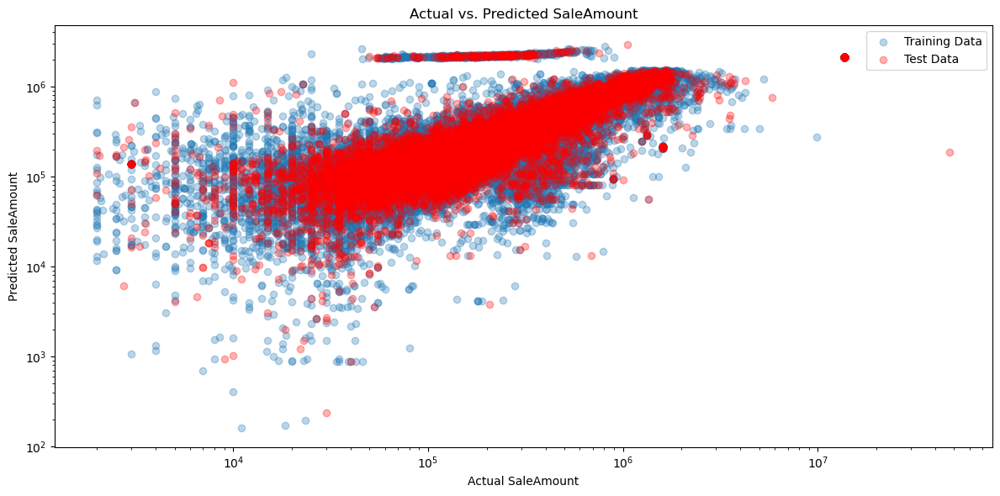

In [14]:
import matplotlib.pyplot as plt
# Q10: Scatterplot of actual vs. predicted values for each partition with log scale
plt.figure(figsize=(12, 6))

# Combine training and test data scatterplots
plt.scatter(y_train, y_train_pred, alpha=0.3, label='Training Data')
plt.scatter(y_test, y_test_pred, alpha=0.3, color='red', label='Test Data')

plt.title('Actual vs. Predicted SaleAmount')
plt.xlabel('Actual SaleAmount')
plt.ylabel('Predicted SaleAmount')
plt.xscale('log')
plt.yscale('log')
plt.legend()

plt.tight_layout()
plt.show()

# Part 1b: Compare and contrast with Dave's regression examples

You now have an AI-generated code vs. the class materials - and I think you would agree both are pretty good! Take some time to the ChatGPT script vs. the class notes and come up with five observations of what is similar vs. different between the two examples. What is in Dave's materials that are not in the AI-generated code? And vice-versa?

### Observation 1

I noticed a difference between Dave's material and the AI-generated code in question 8. The difference was in the approach used to create the random_state. In Dave's material he puts the number directly after "random_state=" and in the AI-generated code the random_state number was saved in a variable called "student_seed_id". "student_seed_id" was then called back after "random_state=". 

### Observation 2

Another difference I noticed was in question 10. Dave put the scatterplot of actual vs predicted for each partition on the same plot and the AI-generated code seperated each partition into two plots. I editted the code for question 10 to make it so that the actual vs predicted for each partition was on the same plot.

### Observation 3

Another difference I noticed was in question 3. Dave got the head and info of the data by just typing the code "df.head()" and "df.info()". The AI-generated code got head and info of the data by saving "df.head()" and "df.info()" into variables called "head_df" and "df_info" and then printed those variables. 

### Observation 4

Another difference I noticed was in question 8. The approach used to create the numpy arrays was different between Dave's code and the AI-generated code. Dave used "np.array()" and the AI-generated code used "X.to_numpy()" and "y.to_numpy()". 

### Observation 5

A similarity I noticed was the approaches used in question 9. All the approaches from the AI-generated code in question 9 are identical to how Dave does it. 

# Part 2a: Now ask ChatGPT to generate a classification recipe
With you active ChatGPT open, ask this question (or something similar):

*'Instead of a regression problem, can you update the script to be a classification problem where the target variable is 0/1 based on if the AssessedValue is greater than the mean value in that column?'*

## Your ChatGPT Screenshot
Make sure the screenshot of time and date is included in the image.

In [15]:
# students: paste both a screenshot of your prompt and code
# (for academic integrity) and your actual ChatGPT python code here

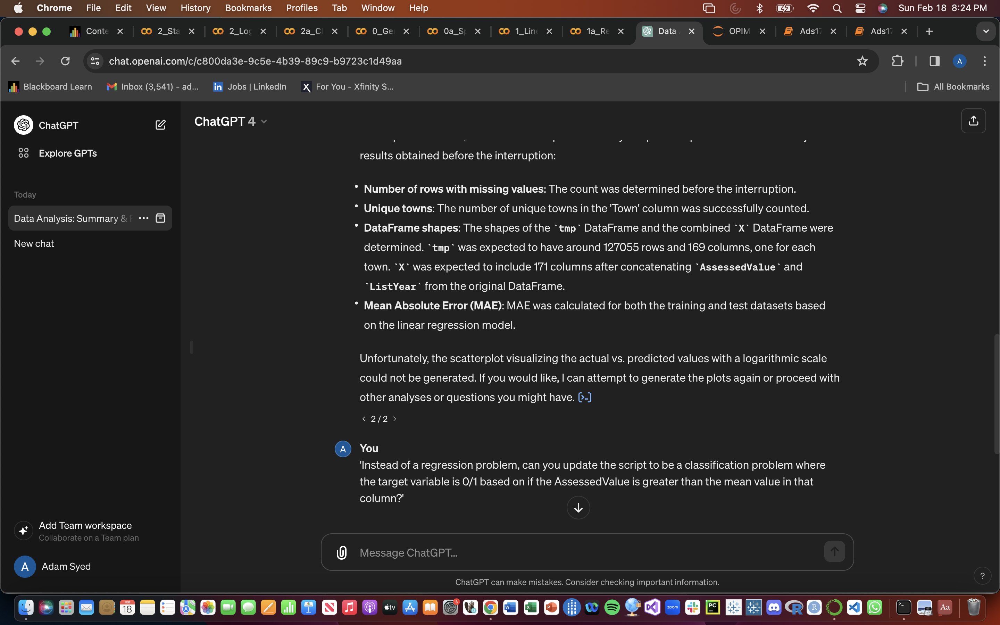

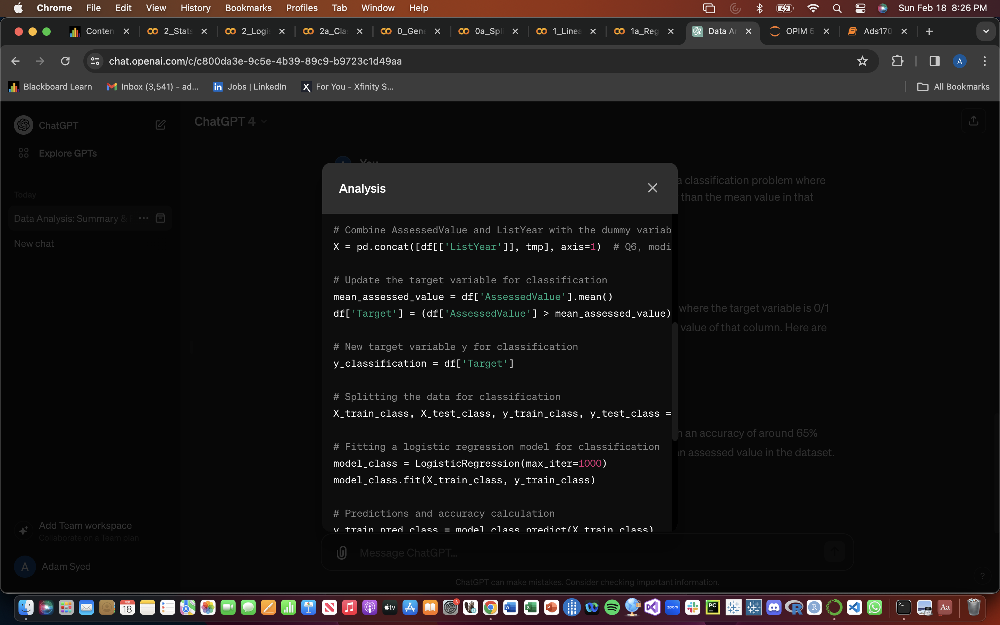

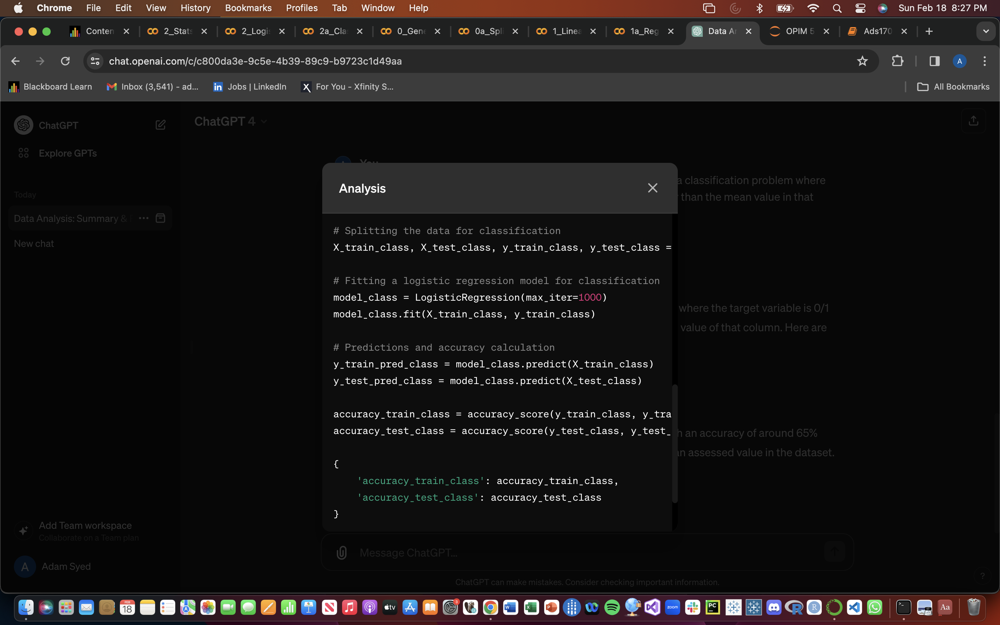

## Your ChatGPT Code
Don't just copy/paste as one cell, make nice subheaders for each question please.

### Q6 exclude AssessedValue

In [46]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
# Combine ListYear with the dummy variables
X = pd.concat([df[['ListYear']], tmp], axis=1)  # Q6, modified to exclude 'AssessedValue'

### Update Target

In [47]:
# Update the target variable for classification
mean_assessed_value = df['AssessedValue'].mean()
df['Target'] = (df['AssessedValue'] > mean_assessed_value).astype(int)

### y for Classification

In [48]:
# New target variable y for classification
y_classification = df['Target']

### Split data

In [49]:
# Splitting the data for classification
X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(X.to_numpy(), y_classification.to_numpy(), test_size=0.2, random_state=2735566)

### Fit LR Model for Classification

In [50]:
# Fitting a logistic regression model for classification
model_class = LogisticRegression(max_iter=1000)
model_class.fit(X_train_class, y_train_class)

LogisticRegression(max_iter=1000)

### Store Preds

In [51]:
# Predictions
y_train_pred_class = model_class.predict(X_train_class)
y_test_pred_class = model_class.predict(X_test_class)

### Train and Test Accuracy

In [52]:
# Accuracy calculation
accuracy_train_class = accuracy_score(y_train_class, y_train_pred_class)
accuracy_test_class = accuracy_score(y_test_class, y_test_pred_class)

{
    'accuracy_train_class': accuracy_train_class,
    'accuracy_test_class': accuracy_test_class
}

{'accuracy_train_class': 0.7726476722679154,
 'accuracy_test_class': 0.7678957931604423}

### Classification Report

In [54]:
print(classification_report(y_test_class, y_test_pred_class))

              precision    recall  f1-score   support

           0       0.80      0.86      0.83     16585
           1       0.69      0.60      0.64      8826

    accuracy                           0.77     25411
   macro avg       0.75      0.73      0.74     25411
weighted avg       0.76      0.77      0.76     25411



### Confusion Matrix

In [40]:
cm = confusion_matrix(y_test_class, y_test_pred_class)
cm

array([[14193,  2392],
       [ 3506,  5320]])

### Plot Confusion Matrix

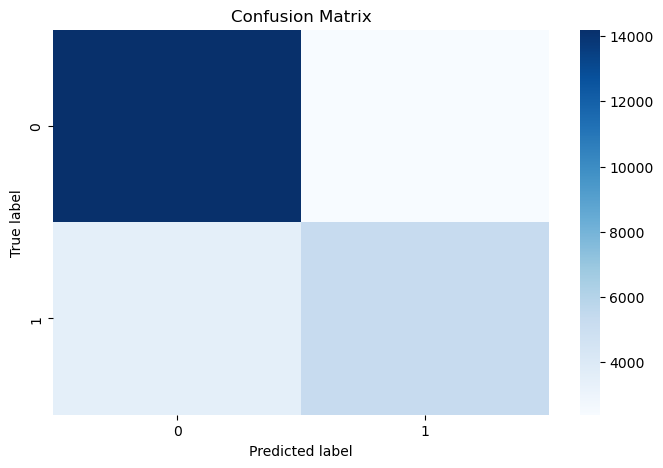

In [58]:
import seaborn as sns
plt.figure(figsize=(8, 5))
plt.title('Confusion Matrix')
sns.heatmap(cm, cmap='Blues', cbar=True)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()

# Part 2b: Compare and contrast with Dave's classification examples

Again, you now have an AI-generated code vs. the class materials - and I think you would agree both are pretty good! Take some time to the ChatGPT script vs. the class notes and come up with five observations of what is similar vs. different between the two examples. What is in Dave's materials that are not in the AI-generated code? And vice-versa?

### Observation 1

I noticed that in Dave's material, he generates a confusion matrix. The AI-generated code did not generate a confusion matrix based on the prompt, so I had to do this myself.

### Observation 2

I also noticed that the AI generated code did not generate a confusion matrix plot like Dave did in this assignment. I also had to create this myself as well. 

### Observation 3

I also noticed that in Dave's material, he generates the precision and recall error metrics for both classes. The AI-generated code did not generate these error metrics based on the prompt.

### Observation 4

I also noticed that the AI-generated code did not generate the classification report like Dave did in the class materials. I created this myself.

### Observation 5

I also noticed that the AI-generated code did not generate and print the true negatives, true positives, false negatives, and false positives like Dave did in the class materials.

# ❗ On Your Own
No one will really care that you can ask ChatGPT to generate some code for you - ChatGPT and similar aids are just tools to help make you a better programmer. So here's what I would do if I were you -

1. Sit down in a quiet place and open a blank notebook.
2. See if you can recreate the code perfectly within 20 minutes. Do this once a day for the entire week.
3. By the end of the week, did you find you were able to code everything in less time? Could you get it down to five minutes? If so, then you really know your stuff!
4. Vanilla regression models are cool, but why not try to  incorporate penalized regression models, or ask ChatGPT to show the coefficients and p-values in the stats models and help you interpret them?!

Feel free to leave your results below if you'd like me to review them.